### About Dataset

As we are always consulting the Doctor for our Health related Problems, it is usually observed that for the same kind of Treatements some
doctors are charging very High , some charging properly while some charges low, it is because there are no fixed ground rates of the Treatments,
Sometimes doctors calculate their diagnosis charges by counting their Years of Experience, sometimes by the services they provide, sometimes 
on the basis of their education and there can be many other reasons.

To Overcome this variability of consultation fees , the following dataset is used for training the model so that every doctor can charge reasonably
for their consultation by taking in account their experience , Rating, Qualification and their profile like in which they are Specialized

In this case we are provided two datasets one is for Training the Model and another one is for Testing the Model

In [2]:
#importing libraries
import pandas as pd
import numpy as np

### Loading Dataset

In [3]:
df=pd.read_excel('Doctors_Consultation_Fee_Train.xlsx')

### Basic Insights of Datasets

In [4]:
df

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350
2,"MBBS, MS - Otorhinolaryngology",9 years experience,NaN,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300
3,"BSc - Zoology, BAMS",12 years experience,NaN,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250
...,...,...,...,...,...,...,...
5956,"MBBS, MS - ENT",19 years experience,98%,"Basavanagudi, Bangalore",ENT Specialist,"98% 45 Feedback Basavanagudi, Bangalore",300
5957,MBBS,33 years experience,NaN,"Nungambakkam, Chennai",General Medicine,NaN,100
5958,MBBS,41 years experience,97%,"Greater Kailash Part 2, Delhi",General Medicine,"97% 11 Feedback Greater Kailash Part 2, Delhi",600
5959,"MBBS, MD - General Medicine",15 years experience,90%,"Vileparle West, Mumbai",General Medicine,General Medical Consultation Viral Fever Treat...,100


In [5]:
#Checking the data types of Columns in dataset
df.dtypes

Qualification         object
Experience            object
Rating                object
Place                 object
Profile               object
Miscellaneous_Info    object
Fees                   int64
dtype: object

All the columns are of Object datatype only fees is in integer type

In [6]:
#checking the Dimension of dataset
df.shape

(5961, 7)

In [7]:
# Checking the column names
df.columns

Index(['Qualification', 'Experience', 'Rating', 'Place', 'Profile',
       'Miscellaneous_Info', 'Fees'],
      dtype='object')

##  Identifying and Handling missing values
A missing value condition occurs whenever a data entry is left empty

In [8]:
df.isnull().sum()

Qualification            0
Experience               0
Rating                3302
Place                   25
Profile                  0
Miscellaneous_Info    2620
Fees                     0
dtype: int64

There are Null Values present in Rating and Miscellaneous_Info Column

In [9]:
# Visualizing The Null Columns
import seaborn as sns
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings('ignore')

<AxesSubplot:>

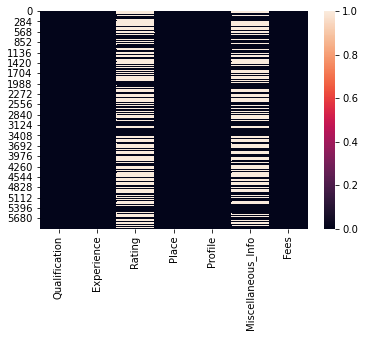

In [10]:
sns.heatmap(df.isnull())

In [11]:
#Checking the presence of Nan Values individually in columns
df['Rating'].unique()

array(['100%', '98%', nan, '99%', '79%', '95%', '97%', '94%', '88%',
       '90%', '80%', '93%', '36%', '78%', '87%', '96%', '82%', '89%',
       '74%', '86%', '92%', '83%', '76%', '85%', '56%', '91%', '68%',
       '60%', '75%', '69%', '73%', '67%', '77%', '33%', '55%', '71%',
       '84%', '45%', '63%', '72%', '81%', '62%', '57%', '7%', '48%',
       '40%', '70%', '64%', '65%', '47%', '58%', '53%'], dtype=object)

In [12]:
df['Miscellaneous_Info'].unique()

array(['100% 16 Feedback Kakkanad, Ernakulam',
       '98% 76 Feedback Whitefield, Bangalore', nan, ...,
       '98% 45 Feedback Basavanagudi, Bangalore',
       '97% 11 Feedback Greater Kailash Part 2, Delhi',
       'General Medical Consultation Viral Fever Treatment Infectious Disease Treatment'],
      dtype=object)

### Replacing Null Values with zero

In [13]:
df.replace(np.nan,0,inplace=True)

In [14]:
# rechecking the null values
df.isnull().sum()

Qualification         0
Experience            0
Rating                0
Place                 0
Profile               0
Miscellaneous_Info    0
Fees                  0
dtype: int64

### Visualizing the Dataset

100    1306
500     938
200     904
300     864
400     424
250     307
150     253
600     215
700     153
800     143
350     143
50       81
450      65
750      34
550      22
650      21
900      18
70       18
80       12
60       11
30        4
10        2
260       2
130       2
180       2
40        2
380       2
220       1
280       1
499       1
5         1
920       1
299       1
125       1
230       1
430       1
630       1
850       1
950       1
20        1
Name: Fees, dtype: int64

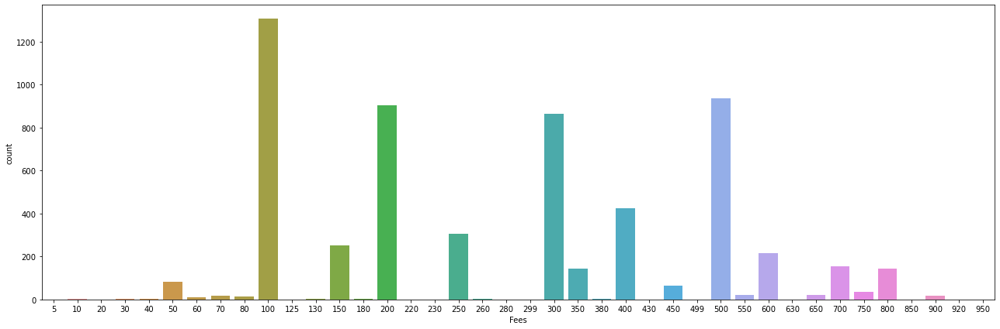

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(22,7))
sns.countplot(x=df['Fees'])
df['Fees'].value_counts()

Highest Fees charged by a Doctor is Rs 950  ,
Around 1306 Doctors charge Rs 100 , Other doctors are charging in between 950 and Rs 5

BDS                                                                                                                  488
BHMS                                                                                                                 477
BAMS                                                                                                                 471
MBBS                                                                                                                 334
MBBS, MS - ENT                                                                                                       220
                                                                                                                    ... 
BDS, MBBS                                                                                                              1
BHMS, Diploma In Skin Aesthetics                                                                                       1
Fellowship in Head & Neck Oncolo

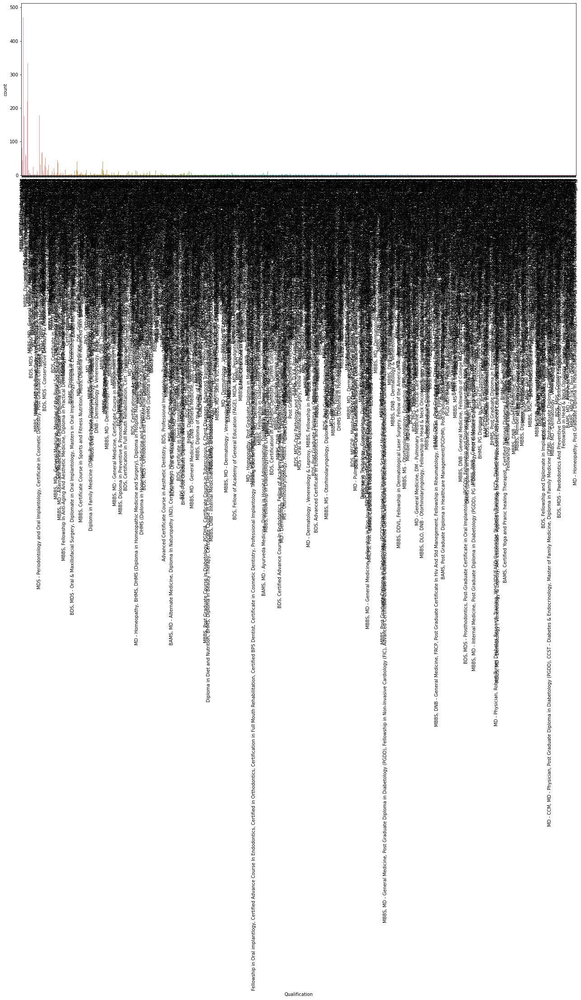

In [16]:
plt.figure(figsize=(22,7))
p=sns.countplot(x=df['Qualification'])
p.set_xticklabels(p.get_xticklabels(),rotation=90)
df['Qualification'].value_counts()

It seems that Doctors did Variety of Degrees and there are many such records, because a single Qualification column contais 2-3 Degree
 so there are many such records

9 years experience     323
10 years experience    294
11 years experience    288
8 years experience     282
12 years experience    279
19 years experience    251
14 years experience    251
13 years experience    242
7 years experience     240
6 years experience     218
15 years experience    200
5 years experience     188
16 years experience    186
18 years experience    184
17 years experience    179
20 years experience    156
21 years experience    154
22 years experience    147
23 years experience    119
4 years experience     115
3 years experience     111
24 years experience     97
0 years experience      87
27 years experience     84
28 years experience     82
25 years experience     82
26 years experience     71
2 years experience      69
30 years experience     68
34 years experience     67
29 years experience     67
32 years experience     65
33 years experience     62
38 years experience     61
39 years experience     57
37 years experience     55
31 years experience     55
3

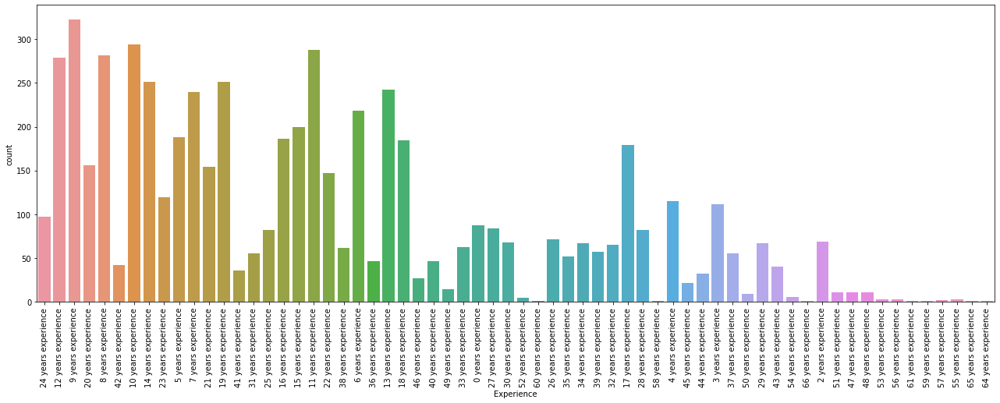

In [17]:
pd.set_option("display.max_rows",None)
plt.figure(figsize=(22,7))
p=sns.countplot(x=df['Experience'])
p.set_xticklabels(p.get_xticklabels(),rotation=90)
df['Experience'].value_counts()

There is only 1 doctor has 66 years of Experience , 

highest number i.e., 323 doctors have Experience of 9 years , 

and remaining Doctors have experience in between 66 years and 2 years

0       3302
100%     684
98%      290
99%      259
97%      241
96%      220
95%      178
94%      115
93%      109
92%       66
90%       66
91%       60
89%       42
88%       41
85%       27
82%       23
86%       21
83%       21
80%       19
77%       16
87%       14
79%       13
84%       13
67%       12
81%       12
71%        9
76%        9
73%        8
75%        8
74%        7
60%        7
78%        6
56%        5
68%        5
69%        4
70%        4
57%        3
72%        3
55%        2
63%        2
64%        2
33%        2
62%        2
48%        1
58%        1
53%        1
65%        1
47%        1
45%        1
36%        1
7%         1
40%        1
Name: Rating, dtype: int64

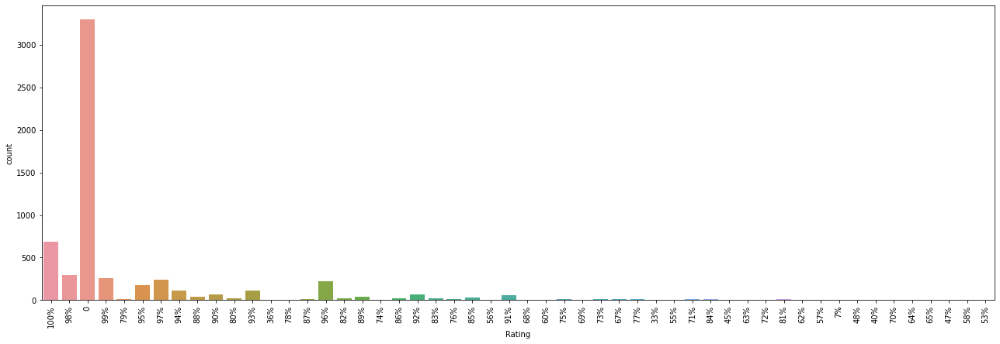

In [18]:
plt.figure(figsize=(22,7))
p=sns.countplot(x=df['Rating'])
p.set_xticklabels(p.get_xticklabels(),rotation=90)
df['Rating'].value_counts()

As there were around 3302 Null values in Ratings column , which were replaced by the zero , so it is showing 3302 doctors showing 0 % ratings,
besides 684 doctors received 100 %ratings and 1 doctor received 40 % ratings , other doctors have received ratings in between

HSR Layout, Bangalore                     75
Andheri West, Mumbai                      70
Dwarka, Delhi                             67
Banjara Hills, Hyderabad                  64
Mulund West, Mumbai                       54
Borivali West, Mumbai                     52
Kandivali West, Mumbai                    50
Indiranagar, Bangalore                    48
Malad West, Mumbai                        47
Whitefield, Bangalore                     47
Malleswaram, Bangalore                    47
Pitampura, Delhi                          45
Vileparle West, Mumbai                    43
Andheri East, Mumbai                      43
Powai, Mumbai                             42
Jubilee Hills, Hyderabad                  40
Marathahalli, Bangalore                   39
Bannerghatta Road, Bangalore              39
Bandra West, Mumbai                       38
Kondapur, Hyderabad                       38
Ghatkopar East, Mumbai                    38
Rohini, Delhi                             37
Janak Puri

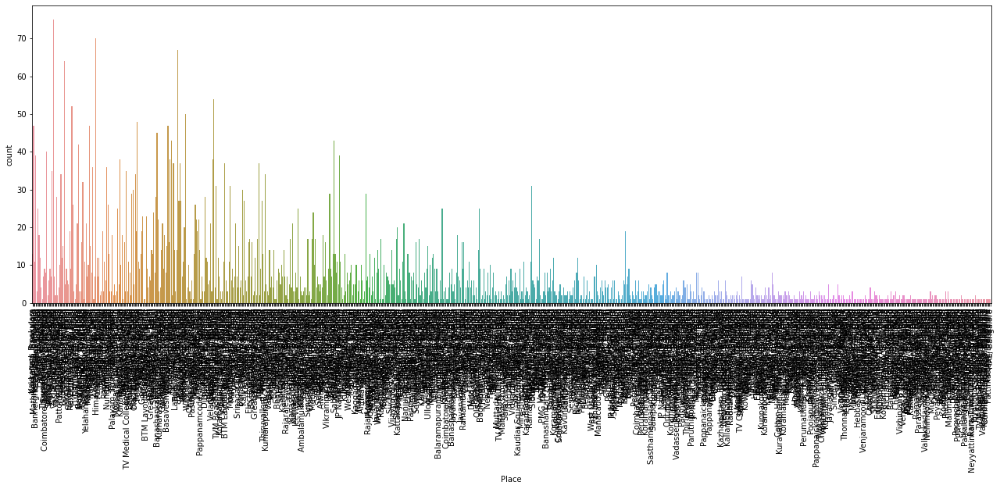

In [19]:
plt.figure(figsize=(22,7))
p=sns.countplot(x=df['Place'])
p.set_xticklabels(p.get_xticklabels(),rotation=90)
df['Place'].value_counts()

It can be observed that places are repeated but as the 'Place' column contains two things one is Area Name and Other is City name,
so in the graph it is not possible to say what frequeny beongs to which

Dentist             1397
General Medicine    1173
Dermatologists      1034
Homeopath            843
Ayurveda             786
ENT Specialist       728
Name: Profile, dtype: int64

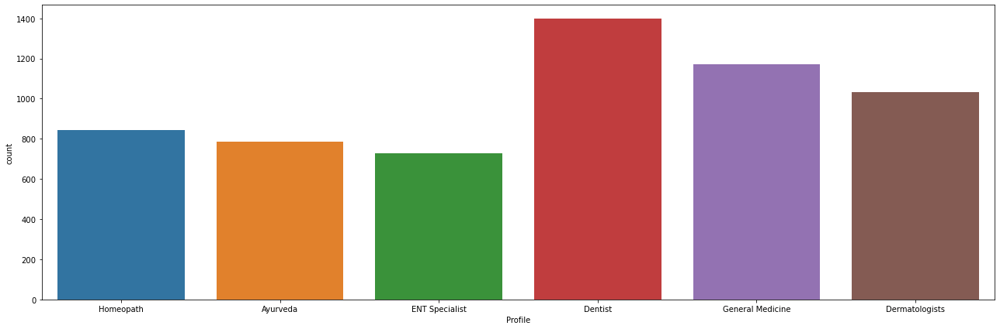

In [20]:
plt.figure(figsize=(22,7))
p=sns.countplot(x=df['Profile'])
#p.set_xticklabels(p.get_xticklabels(),rotation=90)
df['Profile'].value_counts()

The above count plot shows that 1397 doctors are Dentist, 

1173 doctors are in General Medicine,

1034 doctors are Dermatologists

843 are Homeopath , 786 are doctors of Ayurveda and  728 are  ENT Specialist 

100    1306
500     938
200     904
300     864
400     424
250     307
150     253
600     215
700     153
800     143
350     143
50       81
450      65
750      34
550      22
650      21
900      18
70       18
80       12
60       11
30        4
10        2
260       2
130       2
180       2
40        2
380       2
220       1
280       1
499       1
5         1
920       1
299       1
125       1
230       1
430       1
630       1
850       1
950       1
20        1
Name: Fees, dtype: int64

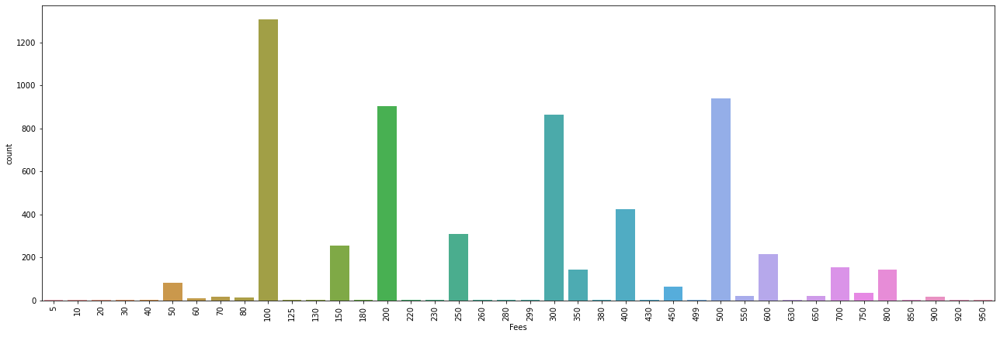

In [21]:
plt.figure(figsize=(22,7))
p=sns.countplot(x=df['Fees'])
p.set_xticklabels(p.get_xticklabels(),rotation=90)
df['Fees'].value_counts()

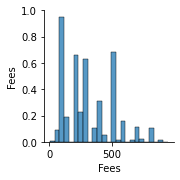

In [22]:
sns.pairplot(df)

The Fees of Doctor ranges from 950 Rs to 5 Rs , whereas highest number i.e 1306 doctors take Rs 100 as their fees and so on

## Feature Engineering 

As the  qualification column contains 2-3 qualification of a doctor in a single column, which is considered as an individual entry for the model,
so to make it easy for the model , we need to divide the Qualification model into separate columns as Qualification1 , Qualification2, Qualification3

The same case is with place Column, the places are repeated but because of area and city the number of unique values in it are getting increased 
so the model gets more data to learn , to make model learn better we will divide the place column into area and City

In [23]:
qualification=df['Qualification'].str.split(",",n=2,expand=True)
df['Qualification1']=qualification[0]
df['Qualification2']=qualification[1]
df['Qualification3']=qualification[2]

In [24]:
df[['Qualification','Qualification1','Qualification2','Qualification3']]

,Qualification,Qualification1,Qualification2,Qualification3
0,"BHMS, MD - Homeopathy",BHMS,MD - Homeopathy,None
1,"BAMS, MD - Ayurveda Medicine",BAMS,MD - Ayurveda Medicine,None
2,"MBBS, MS - Otorhinolaryngology",MBBS,MS - Otorhinolaryngology,None
3,"BSc - Zoology, BAMS",BSc - Zoology,BAMS,None
4,BAMS,BAMS,None,None
5,BAMS,BAMS,None,None
6,BHMS,BHMS,None,None
7,BDS,BDS,None,None
8,"MBBS, MD - General Medicine",MBBS,MD - General Medicine,None
9,"BSc, BDS",BSc,BDS,None


In [25]:
Region=df['Place'].str.split(",",n=1,expand=True)
df["Area"]=Region[0]
df["City"]=Region[1]

### Dropping the columns

as we have divided the data of Qualification column and Place column in Qualification1 , Qualification2, Qualification3 and Area ,City
so we will drop the Qualification and Place .
besides Miscellaneous Data is combination of Rating , No of Feedbacks , Place of Doctor and sometimes the specialzation

In [26]:
df.drop(['Miscellaneous_Info','Place','Qualification'],axis=1,inplace=True)

In [27]:
df

,Experience,Rating,Profile,Fees,Qualification1,Qualification2,Qualification3,Area,City
0,24 years experience,100%,Homeopath,100,BHMS,MD - Homeopathy,None,Kakkanad,Ernakulam
1,12 years experience,98%,Ayurveda,350,BAMS,MD - Ayurveda Medicine,None,Whitefield,Bangalore
2,9 years experience,0,ENT Specialist,300,MBBS,MS - Otorhinolaryngology,None,Mathikere - BEL,Bangalore
3,12 years experience,0,Ayurveda,250,BSc - Zoology,BAMS,None,Bannerghatta Road,Bangalore
4,20 years experience,100%,Ayurveda,250,BAMS,None,None,Keelkattalai,Chennai
5,8 years experience,0,Ayurveda,100,BAMS,None,None,Porur,Chennai
6,42 years experience,0,Homeopath,200,BHMS,None,None,Karol Bagh,Delhi
7,10 years experience,99%,Dentist,200,BDS,None,None,Arekere,Bangalore
8,14 years experience,0,General Medicine,100,MBBS,MD - General Medicine,None,Old City,Hyderabad
9,23 years experience,0,Dentist,100,BSc,BDS,None,Athani,Ernakulam


As you can see the data is in the format of String i.e Object , float , integer . Most models  cannot take in the object / strings as 
input , they only takes the numbers as input.

So it is necessary to Convert Categorical variables into numeric or Quantitative variable 

### Label Encoding

In [28]:
# As all the columns are of Object type its better to convert them labelly for better learning of the Model
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for i in df.columns:
    if df[i].dtypes == object:
        df[i]=le.fit_transform(df[i].astype(str))

In [29]:
# rechecking the dataframe after conversion from object form to integer form
df.head()

,Experience,Rating,Profile,Fees,Qualification1,Qualification2,Qualification3,Area,City
0,16,1,5,100,8,252,650,296,4
1,3,50,0,350,5,241,650,855,0
2,63,0,3,300,79,334,650,452,0
3,3,0,0,250,12,7,650,68,0
4,12,1,0,250,5,426,650,335,1


### Descriptive Statistics

describe() method in python describes the basic features of the data,

It gives short summaries aboout the dataset and measures of the dataset like No of items , mean , Standard_Deviation , minimum value of 
dataset, 25th, 50th(median) and 75% percentile of each  column and Gives the maximum value of the dataset too

In [30]:
df.describe()

,Experience,Rating,Profile,Fees,Qualification1,Qualification2,Qualification3,Area,City
count,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000
mean,23.010904,14.980205,2.441872,307.944640,47.962087,288.075323,580.148968,412.804395,3.098977
std,20.937163,21.520950,1.658014,190.920373,39.371696,131.765907,158.354057,256.586353,2.350982
min,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,0.000000,1.000000,150.000000,6.000000,227.000000,650.000000,195.000000,1.000000
50%,15.000000,0.000000,2.000000,300.000000,79.000000,293.000000,650.000000,409.000000,3.000000
75%,36.000000,43.000000,4.000000,500.000000,79.000000,426.000000,650.000000,626.000000,5.000000
max,63.000000,51.000000,5.000000,950.000000,150.000000,426.000000,650.000000,866.000000,9.000000


Obsevation :-

1)Fees , Qulaification1 column is having remarkable  difference between the 75% and max it means outliers are present

2)The Standard Deviation of fees , qualification2 ,  qualificaton3, area is also high it means that there is high dispersion in the data

3)  all the other columns are converted from labels to integer ,so even if the qualification is having a huge  Differnce in 75% and max then also it is not worth to conclude that their are Outliers

4) in fees column there is high difference between minimum and 25% it indicates that whiskers are present 


## Checking Correlation

Correlation is a statistical metric for measuring to what extent  different variables are Interdependent .

In another word, if one variable changes how it affects the change in another variable

In [31]:
dfcor=df.corr()

<AxesSubplot:>

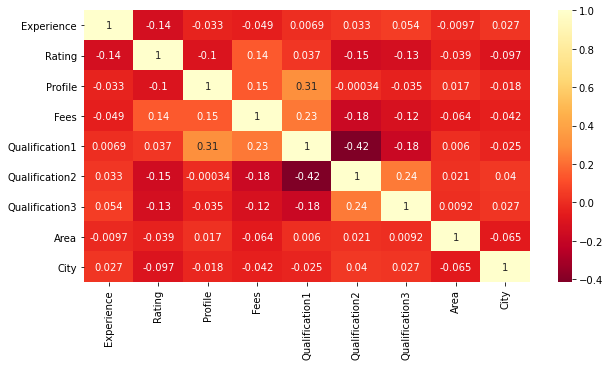

In [32]:
plt.figure(figsize=(10,5))
sns.heatmap(dfcor, cmap="YlOrRd_r", annot=True)

Observation :- 

1) Fees is highly correlated with Qualification , Then Profile, Ratings

2) fees is   negatively correlated with Experience , Area and City

3) Qualification2 and Qualification3 are negatively correlated with anyone 

4) fees and qualification1 are highly correlated 

### Checking Outliers 

Outliers are the values that fall really outside the range of the data, and it is checked through two methods zscore and IQR

Experience           AxesSubplot(0.125,0.125;0.0731132x0.755)
Rating            AxesSubplot(0.212736,0.125;0.0731132x0.755)
Profile           AxesSubplot(0.300472,0.125;0.0731132x0.755)
Fees              AxesSubplot(0.388208,0.125;0.0731132x0.755)
Qualification1    AxesSubplot(0.475943,0.125;0.0731132x0.755)
Qualification2    AxesSubplot(0.563679,0.125;0.0731132x0.755)
Qualification3    AxesSubplot(0.651415,0.125;0.0731132x0.755)
Area              AxesSubplot(0.739151,0.125;0.0731132x0.755)
City              AxesSubplot(0.826887,0.125;0.0731132x0.755)
dtype: object

<Figure size 1584x504 with 0 Axes>

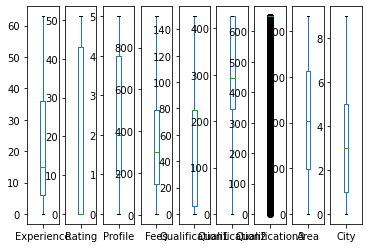

In [33]:
plt.figure(figsize=(22,7))
df.plot(kind='box',subplots=True)

It can be noted that there are no Outliers in the Dataset, Qualification 3 is showing as black because qualification3 column contains 'None' value which is labelly encoded as one of the number 

In [34]:
# statistically checking the Outliers
from scipy.stats import zscore
z=np.abs(zscore(df))

In [35]:
# creatinge new dataset where zscore is less than 3
df_new=df[(z<3).all(axis=1)]

In [36]:
# comparing the dataset with and without Outliers
df_new.shape , df.shape

((5772, 9), (5961, 9))

In [37]:
# calculating the data loss

5961-5770

191

In [38]:
data_loss = ((5961-5770)/5961)*100

In [39]:
data_loss

3.2041603757758765

there is only  3.2 %  Data Loss 

In [40]:
#replacing new dataset into old dataset
df=df_new

###  Checking Skewness 

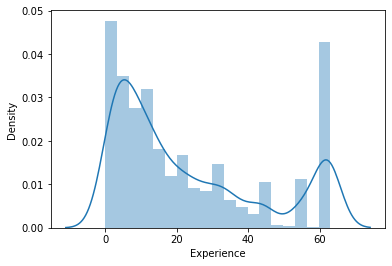

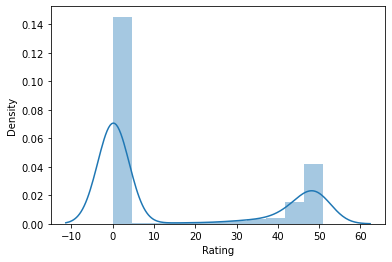

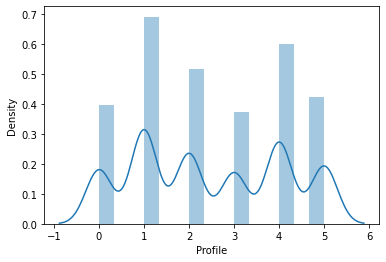

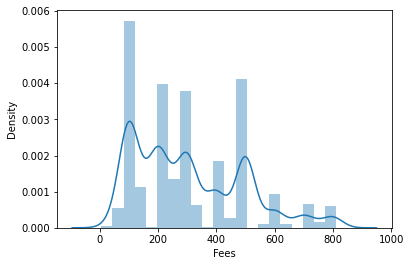

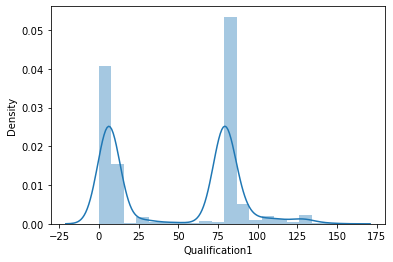

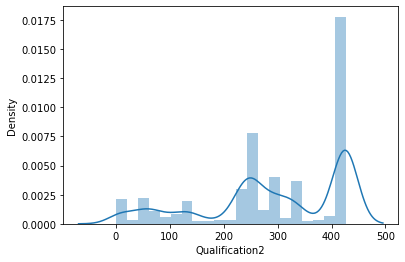

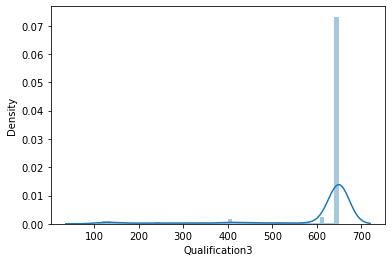

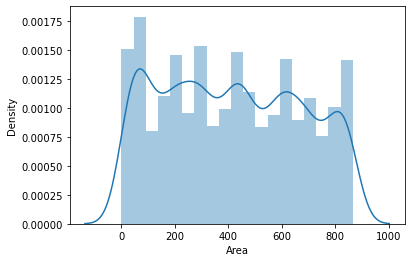

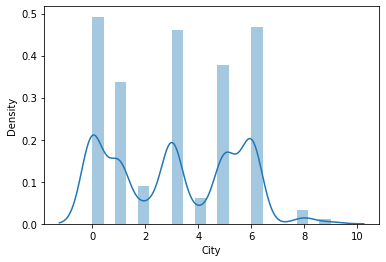

In [41]:
for i in df.columns:
    plt.figure()
    sns.distplot(df[i])

visually it can be concluded that skewness is present in some of the columns

In [42]:
# checking the skewness statistically
df.skew()

Experience        0.818867
Rating            0.839920
Profile           0.091167
Fees              0.712121
Qualification1    0.059380
Qualification2   -0.634870
Qualification3   -2.476580
Area              0.111000
City              0.086446
dtype: float64

As the skew score in Experience , Rating, Fees Qualification2 column is above 0.5 means skewness is present and it should be treated after splitting features 
and target column

### Splitting the Data in X (features)  and Y (Target )

In [43]:
x=df.drop('Fees',axis=1)
x

,Experience,Rating,Profile,Qualification1,Qualification2,Qualification3,Area,City
0,16,1,5,8,252,650,296,4
1,3,50,0,5,241,650,855,0
2,63,0,3,79,334,650,452,0
3,3,0,0,12,7,650,68,0
4,12,1,0,5,426,650,335,1
5,62,0,0,5,426,650,604,1
6,36,0,5,8,426,650,324,3
7,1,51,1,6,426,650,33,0
8,5,0,4,79,249,650,540,5
9,15,0,1,11,8,650,39,4


In [44]:

y=df['Fees']

In [45]:
y

0       100
1       350
2       300
3       250
4       250
5       100
6       200
7       200
8       100
9       100
10      700
11      100
12      200
13      350
14      500
15      200
16      100
17      300
18      400
19      150
21      500
22      200
23      100
24      100
25      100
26      500
27      250
28      100
29      500
30      500
31      500
32      100
33      500
34      300
35      400
36      250
37      300
38      100
39      100
40      250
41      500
42      500
43      300
44      500
45      500
46      200
47      200
48      400
49      200
50      100
51      150
52      650
53      100
54      300
55      600
56      200
57      400
58      500
59      500
60      500
61      200
62      200
63      150
64      200
65      200
66      500
67      500
68      150
69      500
70      300
71      300
72      100
73      100
74      350
75      500
76      100
77      300
78      600
79      200
80      100
81      250
82       50
83      100
84  

As observed Above there was the skewness present in the Features, so it should be treated before Model Learning

In [46]:
from sklearn.preprocessing  import power_transform

df_new=power_transform(x)

df_new=pd.DataFrame(df_new,columns=x.columns)

In [47]:
x=df_new

### finding the best random state and training model for LogisticRegression

In [48]:
#importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score , classification_report, confusion_matrix


In [50]:
maxaccuracy = 0
best_random_state = 0

for i in range(1,500):
    x_train,x_test, y_train , y_test =train_test_split(x,y,test_size=.22,random_state=i)
    lg=LogisticRegression()
    lg.fit(x_train,y_train)
    predlg=lg.predict(x_test)
    accuracy=accuracy_score(y_test,predlg)
    if accuracy > maxaccuracy:
        maxaccuracy = accuracy
        best_random_state =i
print(f"maximum accuracy  is :  {maxaccuracy} and best random stateis {best_random_state}")

maximum accuracy  is :  0.27716535433070866 and best random stateis 429


###### Maximum accuracy of 27 %  is recorded at random state of 429

In [51]:
from sklearn.linear_model import LogisticRegression

x_train,x_test, y_train , y_test =train_test_split(x,y,test_size=.22,random_state=429)
lg = LogisticRegression()
lg.fit(x_train,y_train)
predlg = lg.predict(x_test)
print(accuracy_score(y_test,predlg))
print(confusion_matrix(y_test,predlg))
print(classification_report(y_test,predlg))



0.27716535433070866
[[  0   0   0   0   0   0   1   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   2   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0  13   0   0   0   0   1   0   0   1   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   2   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   3   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   2   0   0   0   0   0   0   0   1   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0 190   0   0   0   0  39   0   0  10   0   0   2
    0   0  41   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   1   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   1   0   0   0   


###### Logistic Regression has got the acuracy of 27% 

## Finding best random state for  DecisionTreeClassifier and training it

In [52]:
from sklearn.tree import DecisionTreeClassifier


maxaccuracy = 0
best_random_state = 0

for i in range(1,1000):
    x_train,x_test, y_train , y_test =train_test_split(x,y,test_size=.22,random_state=i)
    dtc=DecisionTreeClassifier()
    dtc.fit(x_train,y_train)
    preddtc=dtc.predict(x_test)
    accuracy=accuracy_score(y_test,preddtc)
    if accuracy > maxaccuracy:
        maxaccuracy = accuracy
        best_random_state =i
print(f"maximum accuracy  is :  {maxaccuracy} and best random state is {best_random_state}")

maximum accuracy  is :  0.27165354330708663 and best random state is 132


In [53]:
from sklearn.tree import DecisionTreeClassifier

x_train,x_test, y_train , y_test =train_test_split(x,y,test_size=.22,random_state=132)
dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)
preddtc = dtc.predict(x_test)
print(accuracy_score(y_test,preddtc))
print(confusion_matrix(y_test,preddtc))
print(classification_report(y_test,preddtc))


0.27165354330708663
[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    1   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   1   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   2   2   0   0   0   6   0   0   1   0   0   0   0   3   0   0   0
    1   0   1   0   0   0   0   0]
 [  0   0   1   0   0   0   1   0   0   0   0   0   0   0   0   0   0   0
    1   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   1   0   0   1   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   1   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   7   0   0   0 134   7   0  42   0   5   1   0  22   2   7   0
   29   0  15   0   0   4   1   5]
 [  0   0   1   0   0   0  10   8   0  10   0   3   0   0   8   2   2   0
    5   0   0   0   0   1   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   1   0   0   0
    0   0   0   0   0   0   0   0]

###### DecisionTreeClassifier model gives the accuracy of 27 %

## Finding best random state for RandomForestClassifier and training it

In [57]:
from sklearn.ensemble import RandomForestClassifier


maxaccuracy = 0
best_random_state = 0

for i in range(1,1000):
    x_train,x_test, y_train , y_test =train_test_split(x,y,test_size=.22,random_state=i)
    rfc=RandomForestClassifier()
    rfc.fit(x_train,y_train)
    predrfc=rfc.predict(x_test)
    accuracy=accuracy_score(y_test,predrfc)
    #print(f"accuracy is {accuracy} at random_state {i}")
    if accuracy > maxaccuracy:
        maxaccuracy = accuracy
        best_random_state =i
        print(f"accuracy  is :  {maxaccuracy} at random state of  {best_random_state}")
print(f"maximum accuracy  is :  {maxaccuracy} and best random state is {best_random_state}")

accuracy  is :  0.268503937007874 at random state of  1
accuracy  is :  0.2826771653543307 at random state of  2
accuracy  is :  0.28976377952755905 at random state of  4
accuracy  is :  0.29606299212598425 at random state of  7
accuracy  is :  0.2984251968503937 at random state of  9
accuracy  is :  0.2992125984251969 at random state of  13
accuracy  is :  0.3094488188976378 at random state of  65
accuracy  is :  0.3165354330708661 at random state of  307
accuracy  is :  0.3173228346456693 at random state of  436
maximum accuracy  is :  0.3173228346456693 and best random state is 436


maximum accuracy is recorded at random_state of 436

In [63]:

x_train,x_test, y_train , y_test =train_test_split(x,y,test_size=.22,random_state=436)
rfc = RandomForestClassifier()
rfc.fit(x_train,y_train)
predrfc = rfc.predict(x_test)
print(accuracy_score(y_test,predrfc))
print(confusion_matrix(y_test,predrfc))
print(classification_report(y_test,predrfc))


0.315748031496063
[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   1   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   3   0   0   0   9   0   1   1   0   1   0   0   0   0   1   0
    0   0   0   0   0   0]
 [  0   0   1   0   1   0   1   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   0   0   0   0   1   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0]
 [  0   0   0   0   0   0   1   0   0   0   0   0   0   0   0   0   2   0
    0   0   0   0   0   0]
 [  1   0   5   0   0   1 153   3  53   6   0  17   1   0  10   1  32   0
    1   0   4   0   3   1]
 [  0   0   0   0   0   0  16   6  14   3   0  10   1   0   0   0   5   0
    0   0   0   0   0   0]
 [  0   0   1   0   0   0  48   5  74   6   0  37   3   0   3   1  23   0
    0   0   0   0   1   0]
 [  0   0   0   0   1   0   8   3  11   5   0  13   0   0   6   0   7   0

###### RandomForestClassifier  Model gives the accuracy of  31%

## Finding best random state for SVC and training it

In [61]:
from sklearn.svm import SVC


maxaccuracy = 0
best_random_state = 0

for i in range(1,1000):
    x_train,x_test, y_train , y_test =train_test_split(x,y,test_size=.22,random_state=i)
    svc=SVC()
    svc.fit(x_train,y_train)
    predsvc=svc.predict(x_test)
    accuracy=accuracy_score(y_test,predsvc)
    if accuracy > maxaccuracy:
        maxaccuracy = accuracy
        best_random_state =i
        print(f"accuracy  is :  {maxaccuracy} at random state of  {best_random_state}")
print(f"maximum accuracy  is :  {maxaccuracy} and best random state is {best_random_state}")

accuracy  is :  0.2543307086614173 at random state of  1
accuracy  is :  0.2551181102362205 at random state of  2
accuracy  is :  0.27086614173228346 at random state of  4
accuracy  is :  0.2795275590551181 at random state of  5
accuracy  is :  0.284251968503937 at random state of  9
accuracy  is :  0.29133858267716534 at random state of  76
accuracy  is :  0.2929133858267717 at random state of  214
accuracy  is :  0.2968503937007874 at random state of  417
accuracy  is :  0.3047244094488189 at random state of  800
maximum accuracy  is :  0.3047244094488189 and best random state is 800


In [62]:
from sklearn.svm import SVC

x_train,x_test, y_train , y_test =train_test_split(x,y,test_size=.22,random_state=800)
svc = SVC()
svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))


0.3047244094488189
[[  0   0   0   0   0   1   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0]
 [  0   0   0   0   0   2   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0]
 [  0   0   0   0   0  15   0   1   0   0   2   0   0   0   0   1   0   0
    0   0   0   0]
 [  0   0   0   0   0   3   0   1   0   0   0   0   0   0   0   0   0   0
    0   0   0   0]
 [  0   0   0   0   0   2   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0]
 [  0   0   0   0   0 233   0  43   0   0  12   0   0   0   0  23   0   0
    0   0   0   0]
 [  0   0   0   0   0  21   0  14   0   0   4   0   0   0   0   4   0   0
    0   0   0   0]
 [  0   0   0   0   0  91   0  67   0   0  15   0   0   0   0  12   0   0
    0   0   0   0]
 [  0   0   0   0   0  35   0  15   0   0   8   0   2   0   0  11   0   0
    0   0   0   0]
 [  0   0   0   0   0   1   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0]
 [  0   0   0   0   0  77   0  49   0   0  16   0  

###### SupportVectorClass  Model gives the accuracy of 30 %

## Cross Validation of All models 

### Cross - Validation

sometimes in train-test-split there are chances that model may learn less and also to remove  overfitting and underfitting of model 
so cross-validation of the model is necessary and it can be done using cross_val_score

In [64]:
# checking the cross-validation-score of the logistic model
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lg,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f" At  cross fold {j}  the cv_core is {cv_mean} ")

 At  cross fold 2  the cv_core is 0.24324324324324326 
 At  cross fold 3  the cv_core is 0.240990990990991 
 At  cross fold 4  the cv_core is 0.2442827442827443 
 At  cross fold 5  the cv_core is 0.2428960063622109 
 At  cross fold 6  the cv_core is 0.2432432432432432 
 At  cross fold 7  the cv_core is 0.2415134703484218 
 At  cross fold 8  the cv_core is 0.24497826387634902 
 At  cross fold 9  the cv_core is 0.24081715085841232 


###### highest cross_val_score of LogisticRegression is 24%  at cv= 8 

In [65]:
# checking the cross-validation-score of the DecisionTreeClassifier model is 
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(dtc,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f" At  cross fold {j}  the cv_core is {cv_mean} ")

 At  cross fold 2  the cv_core is 0.2143104643104643 
 At  cross fold 3  the cv_core is 0.23596673596673598 
 At  cross fold 4  the cv_core is 0.2234927234927235 
 At  cross fold 5  the cv_core is 0.22921320158755165 
 At  cross fold 6  the cv_core is 0.23735273735273735 
 At  cross fold 7  the cv_core is 0.23423149665868112 
 At  cross fold 8  the cv_core is 0.23527096676284479 
 At  cross fold 9  the cv_core is 0.23648850419229644 


###### Highest cross_val_score of DecisionTreeClassifier is  23% at cv= 6

In [66]:
# checking the cross-validation-score of the RandomForestClassifier model is
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(rfc,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f" At  cross fold {j}  the cv_core is {cv_mean} ")

 At  cross fold 2  the cv_core is 0.2772002772002772 
 At  cross fold 3  the cv_core is 0.2752945252945253 
 At  cross fold 4  the cv_core is 0.2747747747747748 
 At  cross fold 5  the cv_core is 0.28101300201820134 
 At  cross fold 6  the cv_core is 0.28638253638253636 
 At  cross fold 7  the cv_core is 0.2853446391795906 
 At  cross fold 8  the cv_core is 0.2848265432359642 
 At  cross fold 9  the cv_core is 0.2806681322289236 


###### Highest Cross_val_score of RandomForestClassifier is 28 %  at cv= 6

In [67]:
# checking the cross-validation-score of the SVC model
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(svc,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f" At  cross fold {j}  the cv_core is {cv_mean} ")

 At  cross fold 2  the cv_core is 0.24324324324324326 
 At  cross fold 3  the cv_core is 0.240990990990991 
 At  cross fold 4  the cv_core is 0.2442827442827443 
 At  cross fold 5  the cv_core is 0.2428960063622109 
 At  cross fold 6  the cv_core is 0.2432432432432432 
 At  cross fold 7  the cv_core is 0.2415134703484218 
 At  cross fold 8  the cv_core is 0.24497826387634902 
 At  cross fold 9  the cv_core is 0.24081715085841232 


###### Highest cross_val_score of SVC model is 24%  at cv= 8

##  Comparing The accurcay and cross_val_score of each model

In [ ]:
# MODEL                                ACCURACY                  CROSS_VAL_SCORE          DIFFERENCE

# LogisticRegression                        27.7                            24                  3
# DecisionTreeClassifier                    27.1                            23                  4
# RandomForestClassifier                    31.5                            28                  3
# SVC                                       30.4                            24                  6    

As DecisionTreeClassifier and LogisticRegression is having  Difference of 3 between Accuracy and Cross_Val_Score  ,

but RandomForestClassifier is giving highest Accuracy and highest Cross_Val_Score , 
so concluding on a point that RandomForestClassifier will be the best

### Hyper Parameter Tuning

In [68]:
from sklearn.model_selection import GridSearchCV
 # creating parameter list to pass in GridSearchCV
parameters ={'n_estimators':[50,100,150,200,250],
            'random_state' :[412,42,429]}

In [71]:
gsvrfc=GridSearchCV(RandomForestClassifier(),parameters,cv=6)

In [72]:
gsvrfc.fit(x_train,y_train)

GridSearchCV(cv=6, estimator=RandomForestClassifier(),
             param_grid={'n_estimators': [50, 100, 150, 200, 250],
                         'random_state': [412, 42, 429]})

In [73]:
gsvrfc.best_params_   

{'n_estimators': 200, 'random_state': 429}

In [74]:
gsvrfc_pred=gsvrfc.best_estimator_.predict(x_test)

In [75]:
accuracy_score(y_test,gsvrfc_pred)

0.31417322834645667

## Exporting Model in .pkl file

In [76]:
import pickle
filename="Doctor_Consultation_Fees_RFC.pkl"
pickle.dump(gsvrfc.best_estimator_,open(filename,'wb'))

# Reading the Test Data

In [77]:
df_test=pd.read_excel('Doctors_Consultation_Fee_Test.xlsx')

In [78]:
df_test

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info
0,MBBS,35 years experience,NaN,"Ghatkopar East, Mumbai",General Medicine,NaN
1,"MBBS, Diploma in Otorhinolaryngology (DLO)",31 years experience,NaN,"West Marredpally, Hyderabad",ENT Specialist,NaN
2,"MBBS, DDVL",40 years experience,70%,"KK Nagar, Chennai",Dermatologists,"70% 4 Feedback KK Nagar, Chennai"
3,BAMS,0 years experience,NaN,"New Ashok Nagar, Delhi",Ayurveda,NaN
4,"BDS, MDS - Conservative Dentistry & Endodontics",16 years experience,100%,"Kanakpura Road, Bangalore",Dentist,General Dentistry Conservative Dentistry Cosme...
5,"BDS, MDS",14 years experience,90%,"Velachery, Chennai",Dentist,Acrylic Partial Denture Impaction / Impacted T...
6,"MBBS, Diploma in Otorhinolaryngology (DLO)",23 years experience,94%,"Frazer Town, Bangalore",ENT Specialist,"94% 6 Feedback Frazer Town, Bangalore"
7,"BDS, MDS - Pedodontics",9 years experience,94%,"Attapur, Hyderabad",Dentist,RCT - Root Canal Treatment Ceramic Veneers / C...
8,"MD - Ayurveda Medicine, BAMS, Yoga Teachers Tr...",11 years experience,99%,"Banashankari, Bangalore",Ayurveda,"99% 203 Feedback Banashankari, Bangalore"
9,BHMS,44 years experience,NaN,"Mayur Vihar Ph-I, Delhi",Homeopath,NaN


In [79]:
#checking null values of test_data
df_test.isnull().sum()

Qualification            0
Experience               0
Rating                1090
Place                    6
Profile                  0
Miscellaneous_Info     834
dtype: int64

In [80]:
# replacing null data with 0
df_test.replace(np.nan,0,inplace=True)


In [81]:
# splitting qualification data as qualification1, qualification2 and qualification3
qualification=df_test['Qualification'].str.split(",",n=2,expand=True)
df_test['Qualification1']=qualification[0]
df_test['Qualification2']=qualification[1]
df_test['Qualification3']=qualification[2]

In [82]:
# splitting place column as area and city
Region=df_test['Place'].str.split(",",n=1,expand=True)
df_test["Area"]=Region[0]
df_test["City"]=Region[1]

In [83]:
# dropping unncessary columns
df_test.drop(['Miscellaneous_Info','Place','Qualification'],axis=1,inplace=True)

In [84]:
# turning categorical into numeric values
le=LabelEncoder()
for i in df_test.columns:
    if df_test[i].dtypes == object:
        df_test[i]=le.fit_transform(df_test[i].astype(str))

In [85]:
# checking skewness
df_test.skew()

Experience        0.687595
Rating            0.843017
Profile           0.028926
Qualification1    0.013098
Qualification2   -0.458845
Qualification3   -2.144983
Area              0.038172
City              0.007716
dtype: float64

In [86]:
# removing skewness
from sklearn.preprocessing  import power_transform

df_new_test=power_transform(df_test)

df_new_test=pd.DataFrame(df_new_test,columns=x.columns)


In [87]:
# rechecking the model after processing
df_new_test

,Experience,Rating,Profile,Qualification1,Qualification2,Qualification3,Area,City
0,0.599753,-0.829283,0.903871,0.837600,1.115669,0.515404,-0.765058,1.210539
1,0.431385,-0.829283,0.363972,0.837600,-1.040885,0.515404,1.477294,0.870793
2,0.821903,1.055624,-0.222199,0.837600,-1.691647,0.515404,-0.323759,-0.827332
3,-2.064588,-0.829283,-1.654213,-1.310769,1.115669,0.515404,0.541738,0.112447
4,-0.678997,-0.027062,-0.877016,-1.128108,-0.023197,0.515404,-0.212630,-1.449898
5,-0.914406,1.346270,-0.877016,-1.128108,-0.036353,0.515404,1.369225,-0.827332
6,-0.040111,1.377376,0.363972,0.837600,-1.040885,0.515404,-0.819550,-1.449898
7,1.447161,1.377376,-0.877016,-1.128108,0.108487,0.515404,-1.673811,0.870793
8,-1.418931,1.408818,-1.654213,0.877659,-1.987648,0.323269,-1.500588,-1.449898
9,0.954371,-0.829283,1.409548,-0.986075,1.115669,0.515404,0.288927,0.112447


###### now our test_model is ready for the predictions

### loading the model

In [88]:
fitted_model=pickle.load(open("Doctor_Consultation_Fees_RFC.pkl",'rb'))

In [89]:
fitted_model

RandomForestClassifier(n_estimators=200, random_state=429)

In [90]:
#predicions over test data
predictions=fitted_model.predict(df_new_test)

In [91]:
predictions

array([150, 200, 500, ..., 100, 200, 200], dtype=int64)

In [92]:

df_predictions = pd.DataFrame(predictions, columns=['Predicted_Consultation_Fees'])
df_predictions


,Predicted_Consultation_Fees
0,150
1,200
2,500
3,100
4,200
5,200
6,250
7,200
8,150
9,300


###### Exporting the Predictions to CSV file

In [93]:
df_predictions.to_csv("Doctor_Consulation_Predicted_Fees.csv", index=False)

In [94]:
#df_predictions.to_excel("Doctor_Consulation_Predicted_Fees7.xlsx",encoding='UTF-8', index=False)